In [1]:
import numpy as np 
import math
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

import copy 
import pandas as pd
import time
import datetime

from keras.models import Sequential, load_model
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Dropout, Flatten
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
np.random.seed(7)

Using TensorFlow backend.


# Data Preprocessing

In [2]:
Dataset = r'../15minute_data_newyork/15minute_data_newyork.csv'
fulldata = pd.read_csv(Dataset) 

In [3]:
data=fulldata[['dataid','local_15min','grid']]

In [4]:
sorteddata=data.sort_values(by = ['dataid', 'local_15min'])

In [5]:
ids=sorteddata['dataid'].unique().tolist()

In [6]:
housing_data = []
def convertDate(d):
    d = pd.to_datetime(d[:-3])
    return d 

for i in range(len(ids)):
    housing_data.append(sorteddata.loc[sorteddata.dataid==ids[i]])
    housing_data[i] = housing_data[i].reset_index().drop(columns=['index'])
    housing_data[i]['local_15min'] = housing_data[i]['local_15min'].apply(convertDate)
    #Convert datetimes to ints for faster ploting 
    housing_data[i]['15min_ints'] =  housing_data[i]['local_15min'].map(mdates.date2num)

In [7]:
def create_dataset(dataset, look_back=1, look_ahead=None):
	"function for creating dataset for model, X being the known data, and Y being target data"
	if look_ahead is None:
		look_ahead = look_back
	dataX, dataY = [], []
	for i in range(len(dataset)-2*look_back):
		dataX.append(dataset[i:(i+look_back), 0])
		if look_ahead == 0:
			dataY.append(dataset[i + look_back, 0])
		else:
			dataY.append(dataset[(i+look_back):(i+look_back+look_ahead), 0])
		
	return np.array(dataX), np.array(dataY)


In [8]:
#set up
dataframe = housing_data[0]['grid']
dataset = np.matrix(dataframe.values).transpose()
dataset = dataset.astype('float32')

In [9]:
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)

In [10]:
# split into train and test sets
train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:,:]

In [11]:
# reshape into X=t and Y=t+look_back
look_back = 96 #(60mins/15min)*24 hours
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [12]:
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

In [13]:
print(trainX.shape)
print(trainY.shape)

(11642, 96, 1)
(11642, 96)


In [14]:
print(testX.shape)
print(testY.shape)

(5637, 96, 1)
(5637, 96)


# LSTM

https://machinelearningmastery.com/time-series-prediction-lstm-recurrent-neural-networks-python-keras/

In [15]:
# create and fit the LSTM network
# opm = 'adam'
# model = Sequential()
# model.add(LSTM(32, input_shape=(look_back, 1)))
# model.add(Dropout(0.2))
# model.add(Dense(look_back))
# model.compile(loss='mean_squared_error', optimizer=opm)
# model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2, use_multiprocessing=True)

In [16]:
#load
model = load_model('../models/D_0house_model_1_25_adam.h5')

In [17]:
# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [18]:
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform(trainY)
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform(testY)

In [19]:
# calculate root mean squared error on 1st sample
trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[0]))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.91 RMSE
Test Score: 1.61 RMSE


In [20]:
# calculate root mean squared error on total data
trainScore = math.sqrt(mean_squared_error(trainY, trainPredict))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY, testPredict))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 1.29 RMSE
Test Score: 2.46 RMSE


In [21]:
#save
# testscore = ('%.2f' % (testScore)).replace('.', '_')
# model.save(f'../models/D_0house_model_{testscore}_{opm}.h5')

In [22]:
# shift train predictions for plotting
trainPredictPlot = np.empty([dataset.shape[0], trainPredict.shape[1]])
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict

In [23]:
# shift test predictions for plotting
testPredictPlot = np.empty([dataset.shape[0], testPredict.shape[1]])
# testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*4):len(dataset), :] = testPredict

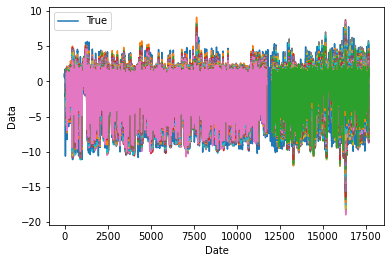

In [24]:
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset), label= 'True' )
plt.plot(trainPredictPlot )
plt.plot(testPredictPlot )
plt.xlabel('Date')
plt.ylabel('Data')
plt.legend()
plt.show()


# Continous test

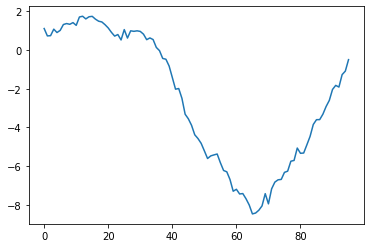

In [25]:
plt.plot(testPredictPlot[13043], label= 'test Predict')

In [26]:
def predicted_Dp1(D,model,scaler):
    "Assumed input isn't scaled"
    sample = D.reshape(1, D.shape[0]) #shape for scaling 
    sample_scaled = scaler.fit_transform(sample)
    sample_scaled = sample_scaled.reshape(1,D.shape[0],1) #shape for 
    sample_scaled_predicted = model.predict(sample_scaled)
    sample_scaled_predicted = sample_scaled_predicted.reshape(1,D.shape[0])
    sample_predicted = scaler.inverse_transform(sample_scaled_predicted)
    Dp1 = sample_predicted.reshape(D.shape[0],)   #reshape for ploting
    return Dp1

In [27]:
Dp1 = predicted_Dp1(testPredictPlot[13043],model,scaler)
Dp2 = predicted_Dp1(Dp1,model,scaler)

In [28]:
math.sqrt(mean_squared_error(Dp1, Dp2)) #check that it's not the same

0.5613004025891952

In [29]:
D2 = np.concatenate((Dp1, Dp2))

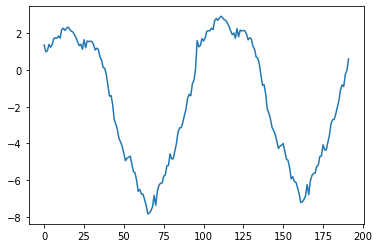

In [30]:
plt.plot(D2, label= '2D')

In [31]:
D3 = np.concatenate((testPredictPlot[13043], Dp1, Dp2))
x = np.linspace(0, D3.shape[0], D3.shape[0])

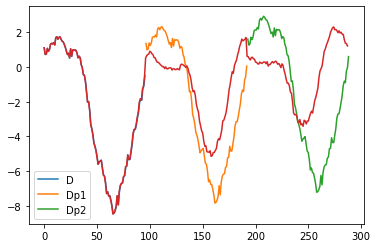

In [32]:
plt.plot(x[:look_back],testPredictPlot[13043] , label= 'D')
plt.plot(x[look_back:2*look_back],Dp1 ,label= 'Dp1')
plt.plot(x[2*look_back:],Dp2 ,label= 'Dp2')
plt.plot(np.concatenate((testPredictPlot[13043], testPredictPlot[13043+look_back], testPredictPlot[13043+2*look_back] )))
plt.legend()



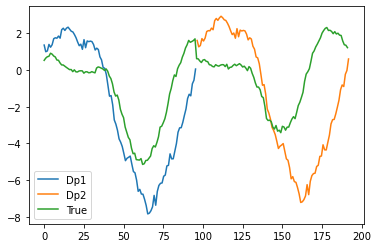

In [33]:
# plt.plot(x[:look_back],testPredictPlot[13043] , label= 'D')
plt.plot(x[:look_back],Dp1 ,label= 'Dp1')
plt.plot(x[look_back:look_back*2],Dp2 ,label= 'Dp2')
plt.plot(np.concatenate((testPredictPlot[13043+look_back], testPredictPlot[13043+2*look_back])), label= 'True')
plt.legend()

In [34]:

m1 = np.concatenate((Dp1, Dp2))
m2 = np.concatenate((testPredictPlot[13043+look_back], testPredictPlot[13043+2*look_back]))
math.sqrt(mean_squared_error(m1, m2)) 

2.8702260438844807

# Experiments 
## Performace on another House

In [35]:
#set up using house 1
dataframe1 = housing_data[1]['grid']
dataset1 = np.matrix(dataframe1.values).transpose()
dataset1 = dataset1.astype('float32')
dataset1 = scaler.fit_transform(dataset1)

In [36]:

#predict on new housing data
house1X, house1Y = create_dataset(dataset1, look_back)
house1X = house1X.reshape(house1X.shape[0], house1X.shape[1],1)
house1Predict = model.predict(house1X)

house1Predict = scaler.inverse_transform(house1Predict)
house1Y = scaler.inverse_transform(house1Y)



In [37]:
#score, closest to 0 the better
train1Score = math.sqrt(mean_squared_error(house1Y[0], house1Predict[0]))
print('Train Score: %.2f RMSE' % (train1Score))

Train Score: 0.84 RMSE


In [38]:
ttrain1Score = math.sqrt(mean_squared_error(house1Y, house1Predict))
print('Train Score: %.2f RMSE' % (ttrain1Score))


Train Score: 1.22 RMSE


In [39]:
#plot set
house1PredictPlot = np.empty([dataset1.shape[0], house1Predict.shape[1]])
house1PredictPlot[:, :] = np.nan
house1PredictPlot[look_back:len(house1Predict)+look_back, :] = house1Predict

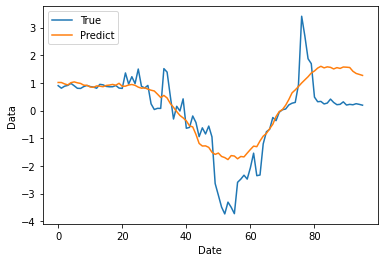

In [40]:
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset1)[look_back:2*look_back], label= 'True' )
plt.plot(house1PredictPlot[look_back], label= 'Predict')
plt.xlabel('Date')
plt.ylabel('Data')
plt.legend()
plt.show()


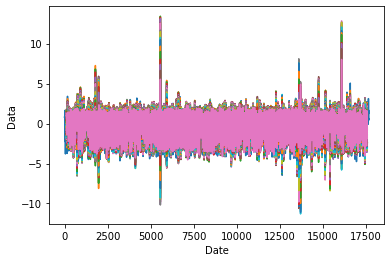

In [41]:
# plot baseline and predictions
plt.plot(scaler.inverse_transform(dataset1), label= 'True' )
plt.plot(house1PredictPlot, label= 'Predict')
# plt.plot(testPredictPlot, label= 'test Predict')
plt.xlabel('Date')
plt.ylabel('Data')
# plt.legend()
plt.show()